In [2]:
from google.colab import drive

In [4]:
drive.mount('/Mi_PC')

Mounted at /Mi_PC


In [7]:
ls

ls: cannot open directory '.': Transport endpoint is not connected


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#plt.style.use("thesis")
from os.path import join
import seaborn as sns
from sys import path
path.insert(0,'../src/')
from glob import glob
from chemulator import Chemulator
rollig_folder="../../Benchmarking/grid_inputs/"
import matplotlib.gridspec as gridspec
from time import perf_counter
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
import h5py
#from snapshot_functions import get_elemental_abundances

ModuleNotFoundError: ignored

In [ ]:
autoencoder_dir="../models/autoencoder-2021-release/"
emulator=Chemulator(autoencoder_dir=autoencoder_dir)
emulator.load_model("../models/emulator-2021-release/")

In [ ]:
data=pd.read_hdf("example_models.hdf",key="df").reset_index(drop=True)
data

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.6,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,0.000044,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1,6939,2000.0,2548.6,143.13,11.56,2.455700e-21,0.870462,2.253720,0.600815,2.050690e-07,...,0.000044,4.747840e-13,3.937840e-08,2.172240e-12,1.437690e-10,2.427510e-14,0.000315,3.904811e+00,5.069267e-08,1.109323e-07
2,6939,3000.0,2548.6,77.07,11.56,2.455700e-21,0.870462,2.253720,0.821727,2.591190e-07,...,0.000044,1.003860e-12,5.880830e-08,5.979380e-12,2.442260e-10,1.866310e-13,0.000322,3.904811e+00,5.069267e-08,1.109323e-07
3,6939,4000.0,2548.6,52.04,11.56,2.455700e-21,0.870462,2.253720,0.916669,5.381340e-07,...,0.000044,4.781420e-13,2.503280e-08,4.993680e-13,1.365850e-10,5.641730e-14,0.000317,3.904811e+00,5.069267e-08,1.109323e-07
4,6939,5000.0,2548.6,41.72,11.56,2.455700e-21,0.870462,2.253720,0.957926,7.702370e-07,...,0.000044,4.422410e-13,1.968780e-08,1.554400e-13,1.326230e-10,1.686190e-14,0.000313,3.904811e+00,5.069267e-08,1.109323e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9997,4951,996000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044288,1.090620e-09,...,0.000008,3.464270e-15,3.740030e-05,1.879980e-12,1.153870e-10,1.765000e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9998,4951,997000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044271,1.084560e-09,...,0.000008,3.461970e-15,3.740030e-05,1.884360e-12,1.151710e-10,1.763940e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9999,4951,998000.0,989240.0,99.95,15.02,1.818800e-04,3.222924,1.917344,0.044270,1.084390e-09,...,0.000008,3.461900e-15,3.740030e-05,1.884470e-12,1.151650e-10,1.763910e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
10000,4951,999000.0,989240.0,99.82,15.02,1.818800e-04,3.222924,1.917344,0.044274,1.085810e-09,...,0.000008,3.462430e-15,3.740030e-05,1.883440e-12,1.152150e-10,1.764160e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
data.values[:,0]

array(['6939', '6939', '6939', ..., '4951', '4951', '4951'], dtype=object)

In [ ]:
print(max(np.log10(data["gas_temp"])))

3.924499996331074


#### We can take one random model between the 10 we have

In [ ]:
#first we set the initial and final time and the index for the element in the initial time
t0=1000
tf=1e6
#Now the indexes where the models star at t0
index=data[(data["Time"]==t0)].index
steps=int((tf-t0)/1000.0)-1

In [ ]:
emulator.physics_labels

['gas_temp',
 'gas_density',
 'radfield',
 'zeta',
 'coldens',
 'h2col',
 'ccol',
 'metallicity']

['gas_temp',
 'gas_density',
 'radfield',
 'zeta',
 'coldens',
 'h2col',
 'ccol',
 'metallicity']

In [ ]:
data.rename(columns={'radfield':  'local_radfield'})

,model,Time,gas_density,gas_temp,dust_temp,av,local_radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.6,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,0.000044,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1,6939,2000.0,2548.6,143.13,11.56,2.455700e-21,0.870462,2.253720,0.600815,2.050690e-07,...,0.000044,4.747840e-13,3.937840e-08,2.172240e-12,1.437690e-10,2.427510e-14,0.000315,3.904811e+00,5.069267e-08,1.109323e-07
2,6939,3000.0,2548.6,77.07,11.56,2.455700e-21,0.870462,2.253720,0.821727,2.591190e-07,...,0.000044,1.003860e-12,5.880830e-08,5.979380e-12,2.442260e-10,1.866310e-13,0.000322,3.904811e+00,5.069267e-08,1.109323e-07
3,6939,4000.0,2548.6,52.04,11.56,2.455700e-21,0.870462,2.253720,0.916669,5.381340e-07,...,0.000044,4.781420e-13,2.503280e-08,4.993680e-13,1.365850e-10,5.641730e-14,0.000317,3.904811e+00,5.069267e-08,1.109323e-07
4,6939,5000.0,2548.6,41.72,11.56,2.455700e-21,0.870462,2.253720,0.957926,7.702370e-07,...,0.000044,4.422410e-13,1.968780e-08,1.554400e-13,1.326230e-10,1.686190e-14,0.000313,3.904811e+00,5.069267e-08,1.109323e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9997,4951,996000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044288,1.090620e-09,...,0.000008,3.464270e-15,3.740030e-05,1.879980e-12,1.153870e-10,1.765000e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9998,4951,997000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044271,1.084560e-09,...,0.000008,3.461970e-15,3.740030e-05,1.884360e-12,1.151710e-10,1.763940e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9999,4951,998000.0,989240.0,99.95,15.02,1.818800e-04,3.222924,1.917344,0.044270,1.084390e-09,...,0.000008,3.461900e-15,3.740030e-05,1.884470e-12,1.151650e-10,1.763910e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
10000,4951,999000.0,989240.0,99.82,15.02,1.818800e-04,3.222924,1.917344,0.044274,1.085810e-09,...,0.000008,3.462430e-15,3.740030e-05,1.883440e-12,1.152150e-10,1.764160e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
models=[]
i=data[(data["coldens"]*6.289E-22>0.1) & (data["Time"]==t0)].index
i=np.random.choice(i,replace=False)
models.append(i)
i=data[(data["coldens"]*6.289E-22>5) & (data["gas_temp"]<100) & (data["Time"]==t0)].index
i=np.random.choice(i)
models.append(i)
i=np.random.choice(data[(data["gas_temp"]>2000) & (data["Time"]==t0)].index)
models.append(i)
i=np.random.choice(data[(data["zeta"]>1000) & (data["Time"]==t0)].index)
models.append(i)
labels=["Av=0","High Av","High T","High $\zeta$"]

In [ ]:
models

[3001, 2001, 5002, 8002]

In [ ]:
init_cond=[]
for i in models:
    init_cond.append(emulator.prepare_inputs(
        data.loc[i:i].reset_index(drop=True),learn_scaling=False)
    )

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
init_cond[0]

,gas_temp,gas_density,radfield,zeta,coldens,h2col,ccol,metallicity,Chem_1,Chem_2,Chem_3,Chem_4,Chem_5,Chem_6,Chem_7,Chem_8
0,0.656911,0.393888,0.438786,0.726373,0.651082,0.323044,0.608299,0.146815,0.00493,0.376715,0.355504,0.223854,0.474384,0.037445,0.87622,0.662961


In [ ]:
predictions=[]
steps=int((1e6-t0)/1000.0)-1
for cond in init_cond:
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond,1)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond[emulator.chem_labels]=output[emulator.chem_labels]
    predictions.append(pred)

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEA

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\4224150144.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo


##### Now we have the 4 models for the step size=1000

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
predicted_vals=[]
for i in range(4):
    predicted_vals.append(emulator.recover_real_values(predictions[i])[plot_specs])

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
predicted_vals[0]

,gas_temp,dust_temp,H,H+,H2,C,C+,CO,O,O+,H2O
0,1069.002114,15.838545,1.000000,0.000125,0.002486,6.064499e-09,0.000006,4.687007e-10,0.000010,1.284074e-09,7.870992e-11
1,1087.401685,16.214944,0.956356,0.000192,0.000973,6.923039e-09,0.000007,1.642324e-10,0.000012,2.190349e-09,4.126497e-12
2,1258.777504,16.633040,0.923975,0.000287,0.000427,5.180682e-09,0.000008,4.710894e-11,0.000012,3.175109e-09,5.219036e-13
3,1396.486690,17.241479,0.903926,0.000414,0.000211,4.537977e-09,0.000009,1.573715e-11,0.000012,4.546016e-09,1.111389e-13
4,1482.305106,17.872846,0.887799,0.000516,0.000124,4.175408e-09,0.000008,6.909355e-12,0.000012,5.606275e-09,3.774890e-14
...,...,...,...,...,...,...,...,...,...,...,...
993,504.940442,17.990392,0.961071,0.000805,0.000184,4.665186e-09,0.000006,4.254692e-14,0.000008,4.087842e-09,2.947293e-16
994,504.940442,17.990392,0.961071,0.000805,0.000184,4.665186e-09,0.000006,4.254692e-14,0.000008,4.087842e-09,2.947293e-16
995,504.940442,17.990392,0.961071,0.000805,0.000184,4.665186e-09,0.000006,4.254692e-14,0.000008,4.087842e-09,2.947293e-16
996,504.940442,17.990392,0.961071,0.000805,0.000184,4.665186e-09,0.000006,4.254692e-14,0.000008,4.087842e-09,2.947293e-16


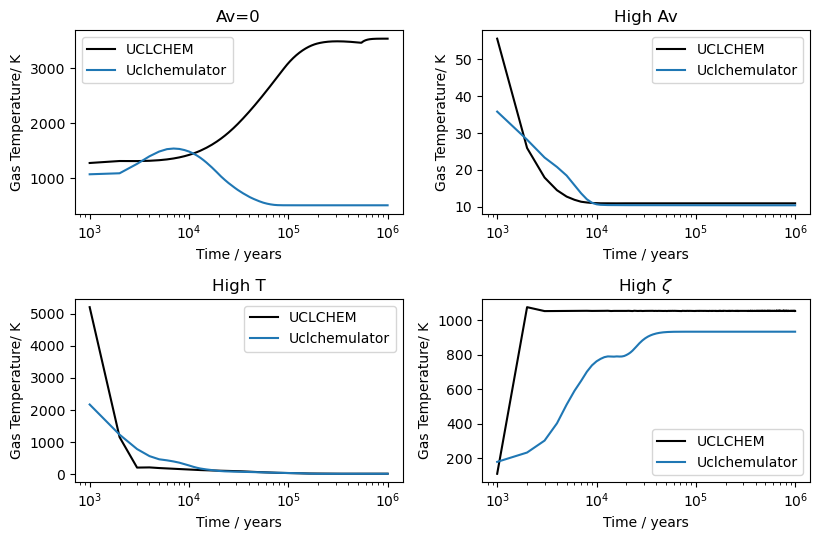

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
axes=axes.flatten()

for i,ax in enumerate(axes):
    j=models[i]
    time=data.loc[j:j+steps-1,"Time"].values
    real_temp=data.loc[j:j+steps-1,"gas_temp"].values
    ax.plot(time,real_temp,label="UCLCHEM",color="black")
    ax.plot(time,predicted_vals[i]["gas_temp"],label="Uclchemulator")
    ax.set(xscale="log")
    ax.legend()
    ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
    ax.set(title=labels[i])
#fig.savefig("dataset_time_testing.png",dpi=300)

In [ ]:
models

[3001, 2001, 5002, 8002]

##### Let's take one by one of the models and take the three different timesteps

In [ ]:
j=models[0]
data_av0=data.loc[j:j+steps-1]

In [ ]:
data_av0 #actual data
data_av0['dust_temp']=pd.to_numeric(data_av0['dust_temp'])

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_18580\2905009599.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_av0['dust_temp']=pd.to_numeric(data_av0['dust_temp'])


In [ ]:
pred_av0 = predicted_vals[0] #predicciones

In [ ]:
def get_plot_df(real,pred):
    df=pd.DataFrame({"Real":real,"Predicted":pred})
    df=df.groupby("Real")["Predicted"].agg([lambda x: np.percentile(x,10),
            lambda x: np.percentile(x,50),
            lambda x: np.percentile(x,90)]).reset_index()
    df.columns=["Real","lower","median","upper"]
    return df

In [ ]:
# real_vals.shape
real=data_av0[plot_specs]
#predicted_vals.shape
predicted=pred_av0

predicted=predicted.to_numpy()
real=real.to_numpy()

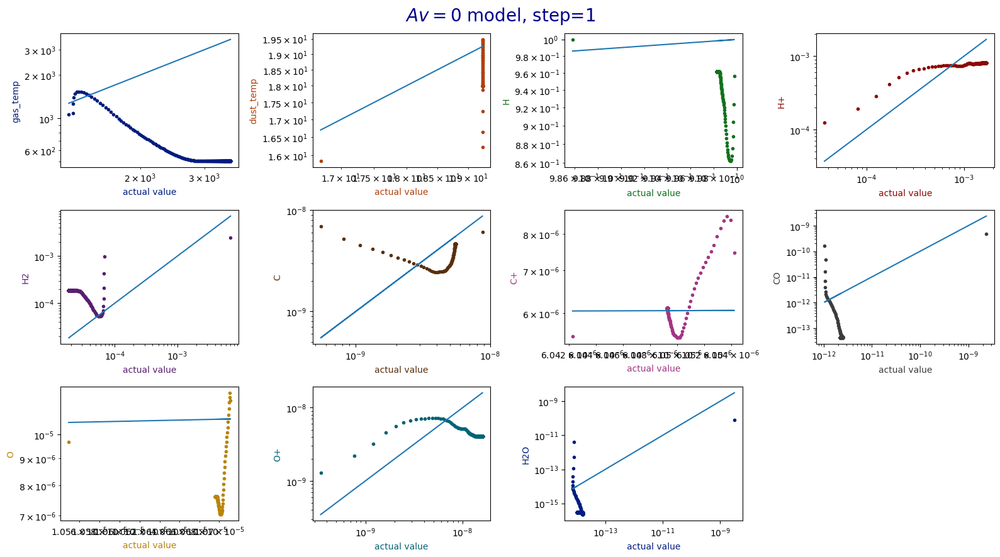

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(data_av0[plot_specs[j]],pred_av0[plot_specs[j]],'.', color=colors[i])
    ax.plot(data_av0[plot_specs[j]],data_av0[plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('$Av=0$ model, step=1', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

#### Now lets try with the three time-steps fpr the four models

In [ ]:
steps_1=int((1e6-t0)/1000.0)-1
steps_100=int((1e6-t0)/100.0)-1
steps_1000=int((1e6-t0)/1.0)-1
pasos=[steps_1,steps_100,steps_1000]

In [ ]:
cond=init_cond[0]
predictions_av0=[]
inicio=time.time()
for p in range(len(pasos)): #esto toma los tres diferentes pasos
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    paso=10**p
    for step in range(pasos[p]):
        print(paso)
end=time.time()

AttributeError: 'numpy.ndarray' object has no attribute 'time'

In [ ]:
(inicio-end)

In [ ]:

#n=0
#for cond in init_cond:
cond=init_cond[0]
predictions_av0=[]
for p in range(len(pasos)): #esto toma los tres diferentes pasos
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(pasos[p]):
        output = emulator.predict_multiple_timesteps(cond,10**p)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond[emulator.chem_labels]=output[emulator.chem_labels]
    predictions_av0.append(pred) #predicciones para el mismo modelo pero variando el paso
#predictions_av0 = predictions
#     if n == 1: predictions_Hav = predictions
#     if n == 2: predictions_HT = predictions
#     if n == 3: perdictions_Hzeta = predictions
#     n=n+1
#     pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
#     for step in range(steps):
#         output = emulator.predict_multiple_timesteps(cond,1)
#         pred=pred.append(output,sort=False) #esto evalua el modelo
#         cond["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
#         cond[emulator.chem_labels]=output[emulator.chem_labels]
#     predictions.append(pred)

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_19440\1973516038.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

with open('your_file.txt', 'w') as f:
    for line in lines:
        f.write(f"{line}\n")

In [ ]:
plot_df=pd.DataFrame()
plot_specs=["H","H+","H2","C","C+","CO","CH3OH","O","CH+","H2O","CO2","E-"]
plots=[0,1]+[i+2 for i in range(len(emulator.autoencoder.species)) if emulator.autoencoder.species[i] in plot_specs]
labels=["$log(T_g / K )$","$log(T_d / K )$"]+[f"log X({emulator.autoencoder.species[i-2]})"  for i in plots[2:] ]

for nsteps in [1000,100,1]:

    predict=emulator.recover_real_values(predicts[nsteps])
    predict=np.log10(predict).round(1)
    for i,idx in enumerate(plots):
        df=get_plot_df(reals[nsteps][:,idx],predict.values[:,idx])
        df["Quantity"]=labels[i]
        df["Nsteps"]=nsteps
        plot_df=plot_df.append(df)

NameError: name 'predicts' is not defined

In [ ]:
real.shape

(998, 11)

In [ ]:
predicted.shape

(998, 11)

In [ ]:
k=498
np.percentile(p[k*2:(k+1)*2],50)

NameError: name 'p' is not defined

In [ ]:
medianas_real=[]
medianas_pred=[]
std_up=[]
std_low=[]

for spec in range(11):
    r=np.sort(real[:,spec])
    #p=predicted[:,spec]
    index=[]
    for i in r:
        index.append(np.where(real[:,spec]==i)[0][0])
    p=predicted[:,spec][index]
    #Ahora r esta ordenado en forma ascendente y p esta ordenado de la misma manera
    r_med=[]
    p_med=[]
    s_up=[]
    s_low=[]
    for k in range(498):
        r_med.append(np.percentile(r[k*2:(k+1)*2],50))
        #p_med.append(np.median(p[k*2:(k+1)*2]))
        uper=np.percentile(np.log10(p[k*2:(k+1)*2]),90)
        m=np.percentile(p[k*2:(k+1)*2],50)
        lower=np.percentile(np.log10(p[k*2:(k+1)*2]),10)
        #standar=np.sum(( np.log2(p[k*2:(k+1)*2])-np.log2(np.mean(r[k*2:(k+1)*2])) )**2)
        #s.append(np.sqrt(standar/2))
        #s.append([uper,lower])
        p_med.append(m)
        s_up.append(uper)
        s_low.append(lower)


    medianas_real.append(r_med)
    medianas_pred.append(p_med)
    std_up.append(s_up)
    std_low.append(s_low)


medianas_real=[]
medianas_pred=[]
std=[]
for spec in range(11):
    r=np.sort(real[:,spec])
    #p=predicted[:,spec]
    index=[]
    for i in r:
        index.append(np.where(real[:,spec]==i)[0][0])
    p=predicted[:,spec][index]
    #Ahora r esta ordenado en forma ascendente y p esta ordenado de la misma manera
    r_med=[]
    p_med=[]
    s=[]
    for k in range(498):
        r_med.append(np.median(r[k*2:(k+1)*2]))
        p_med.append(np.median(p[k*2:(k+1)*2]))
        
        standar=np.sum(( np.log10(p[k*2:(k+1)*2])-np.log10(np.mean(r[k*2:(k+1)*2])) )**2)
        s.append(np.sqrt(standar/2))
        
    medianas_real.append(r_med)
    medianas_pred.append(p_med)
    std.append(s)

In [ ]:
# medianas_real1=np.log10(np.array(medianas_real))
# medianas_pred1=np.log10(np.array(medianas_pred))
# #std1=np.log10(np.array(std))
# std1_low=np.array(std_low)
# std1_up=np.array(std_up)

In [ ]:
medianas_real1=np.log10(np.array(medianas_real))
medianas_pred1=np.log10(np.array(medianas_pred))
#std1=np.log10(np.array(std))
std1=np.array(std)

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    x=np.log10(data_av0[plot_specs[j]].values)
    y=np.log10(pred_av0[plot_specs[j]].values)
    ax.plot(x,y,'.', color=colors[i])

    j=j+1

    ax.plot(medianas_real1[i],medianas_pred1[i],'-', color='green')
    ax.fill_between(medianas_real1[i], medianas_pred1[i]-std1[i], medianas_pred1[i]+std1[i], alpha=0.3, color='green')
    ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('Benchmarking for the ten models for the step size = 1000', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    #x=np.log10(real[plot_specs[j]].values)
    #y=np.log10(predicted[plot_specs[j]].values)
    #ax.plot(x,y,'.', color=colors[j])
    #ax.plot(real[plot_specs[j]],real[plot_specs[j]])

    ax.plot(medianas_real1[i],medianas_pred1[i],'-', color='green')
    #ax.fill_between(medianas_real1[i], medianas_pred1[i]-std1_low[i],
                    #medianas_pred1[i]+std1_up[i], alpha=0.3, color='green')
    ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3, color='green')
    ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Benchmarking for the ten models for the step size = 1000', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
test_steps=[1,100,1000]

input_data=data_av0[data_av0["Time"]==1000].reset_index(drop=True)
#estas van a ser las condiciones iniciales del emulador

#output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=data_av0 #estos son los valores que quderemos emular

#output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)
idx=(output_data["Time"]==998000.0)
full_runs=output_data.loc[idx,"outputFile"].unique()

input_data=input_data[input_data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)


output_data["dust_temp"]=output_data["dust_temp"].astype(float)

In [ ]:
input_data=data_av0[data_av0["Time"]==1000].reset_index(drop=True)
input_data

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,4611,1000.0,2414900.0,55.55,19.3,23.152,87.649612,0.033289,0.000031,1.471000e-13,...,0.00002,1.207150e-18,0.00005,3.604370e-13,1.934970e-12,1.033920e-17,0.00002,3.681290e+22,2.161860e+21,5.435751e+17


In [ ]:
test_steps=[1,100,1000]

input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)

output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)
idx=(output_data["Time"]==1e6)
full_runs=output_data.loc[idx,"outputFile"].unique()

input_data=input_data[input_data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)


output_data["dust_temp"]=output_data["dust_temp"].astype(float)

array([['4611', 1000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17],
       ['4611', 2000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17],
       ['4611', 3000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17],
       ...,
       ['4611', 996000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17],
       ['4611', 997000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17],
       ['4611', 998000.0, 2414900.0, ..., 3.681289736425336e+22,
        2.1618597778871089e+21, 5.435750683772052e+17]], dtype=object)

In [ ]:
test_steps=[1,100,1000]
data=data[(data["Time"]==1000) & (data['model'] is in models)].reset_index(drop=True)
#input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)



output_data=data.loc[data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)

SyntaxError: invalid syntax (1875267321.py, line 2)

In [ ]:
data['model'].isin(models)

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: model, dtype: bool

In [ ]:
models

[3001, 2001, 5002, 8002]

In [ ]:
data.loc[idx,"gas_temp"]

Series([], Name: gas_temp, dtype: float64)

In [ ]:
#idx array has the elements where the list ends
idx=(data["Time"]==1e6)

#here we have the different values of outputfile corresponding to the idx indexes
#full_runs=output_data.loc[idx,"outputFile"].unique()
full_runs=

#this in order to get the corresponding actual values in the "data" file.
data=data[data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
#once they have the corresponding values, they sort the "data" according to the "oututFile" order.

#here they are taking the values of "outputFile" in "output_data" if they are in full_runs
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)
#Then they sort the out_put values first in Time ordere, and "outputFile" in second place.

output_data["dust_temp"]=output_data["dust_temp"].astype(float)

KeyError: 'outputFile'

# Prediction Accuracy

We want to see how prediction accuracy varies with time. Get the input values at t=0 year and then predict their values at t=1000 yr, t=0.1 yr and t=1Myr

Then we can do the plots we did to compare predicted and real values for single time steps in the prototyping notebook but after that many time steps.

It's more quantitative than "here's some models".


In [ ]:
data.loc[models,"gas_temp"]

5002    5208.70
2001      55.55
4002    2090.62
8002     110.73
Name: gas_temp, dtype: float64

In [ ]:
data[data['Time'] == 1000]

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.600,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,4.409160e-05,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1001,17604,1000.0,66019.000,23.05,16.17,3.152000e-15,36.610960,2.203208,0.999999,6.034190e-07,...,6.899150e-05,7.823760e-14,2.075440e-09,6.819330e-14,6.393870e-14,6.883290e-15,0.000507,5.011872e+06,9.380039e-04,4.165134e-06
2001,4611,1000.0,2414900.000,55.55,19.3,2.315200e+01,87.649612,0.033289,0.000031,1.471000e-13,...,1.972500e-05,1.207150e-18,4.999420e-05,3.604370e-13,1.934970e-12,1.033920e-17,0.000020,3.681290e+22,2.161860e+21,5.435751e+17
3001,9949,1000.0,932.180,1274.46,16.7,4.551800e-01,42.928924,228.086720,0.985842,3.682350e-05,...,9.270550e-07,9.454070e-13,2.336190e-09,1.919290e-10,1.181710e-12,8.827320e-12,0.000048,7.237690e+20,1.205468e+11,2.046763e+12
4002,17967,1000.0,76.149,2090.62,18.77,8.575300e-07,76.393350,0.197419,0.999974,1.473610e-07,...,8.858620e-06,1.691320e-14,9.812720e-12,2.806620e-11,3.830680e-15,1.170920e-11,0.000067,1.363536e+15,7.363169e+10,7.151156e+02
5002,4674,1000.0,18685.000,5208.70,48.54,5.187800e+01,8189.360700,0.303180,0.999967,2.103100e-05,...,2.152090e-05,1.317600e-13,2.606750e-11,8.240150e-16,5.797530e-14,1.048570e-12,0.000183,8.248975e+22,5.493718e+13,1.058395e+17
6002,927,1000.0,118.990,508.02,10.0,1.686500e-09,0.433760,7.084350,0.042252,7.187260e-08,...,1.480910e-07,2.408280e-14,3.812860e-09,6.911580e-09,2.105120e-11,1.064270e-12,0.000003,2.681637e+12,6.738345e+09,3.196302e+04
7002,8095,1000.0,1524.400,6292.33,20.2,1.258300e-03,109.963866,286.088236,0.999943,5.662900e-05,...,1.073640e-05,7.108030e-16,6.300870e-13,6.259200e-15,1.279760e-15,1.814420e-13,0.000141,2.000783e+18,5.793193e+10,5.237670e+09
8002,1709,1000.0,3444300.000,110.73,10.84,2.138900e-06,5.026318,1764.818306,0.031263,1.232350e-08,...,1.161650e-05,1.216310e-13,1.579420e-05,1.553700e-10,1.841890e-08,1.822040e-13,0.000016,3.400948e+15,1.001785e+09,1.762983e+05
9002,4951,1000.0,989240.000,47.48,10.0,1.818800e-04,3.222924,1.917344,0.004451,9.540340e-11,...,8.349120e-06,1.138370e-15,3.641940e-06,1.077600e-11,6.200920e-11,2.107450e-16,0.000016,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
data[data['Time'] == 1000]

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.600,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,4.409160e-05,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1001,17604,1000.0,66019.000,23.05,16.17,3.152000e-15,36.610960,2.203208,0.999999,6.034190e-07,...,6.899150e-05,7.823760e-14,2.075440e-09,6.819330e-14,6.393870e-14,6.883290e-15,0.000507,5.011872e+06,9.380039e-04,4.165134e-06
2001,4611,1000.0,2414900.000,55.55,19.3,2.315200e+01,87.649612,0.033289,0.000031,1.471000e-13,...,1.972500e-05,1.207150e-18,4.999420e-05,3.604370e-13,1.934970e-12,1.033920e-17,0.000020,3.681290e+22,2.161860e+21,5.435751e+17
3001,9949,1000.0,932.180,1274.46,16.7,4.551800e-01,42.928924,228.086720,0.985842,3.682350e-05,...,9.270550e-07,9.454070e-13,2.336190e-09,1.919290e-10,1.181710e-12,8.827320e-12,0.000048,7.237690e+20,1.205468e+11,2.046763e+12
4002,17967,1000.0,76.149,2090.62,18.77,8.575300e-07,76.393350,0.197419,0.999974,1.473610e-07,...,8.858620e-06,1.691320e-14,9.812720e-12,2.806620e-11,3.830680e-15,1.170920e-11,0.000067,1.363536e+15,7.363169e+10,7.151156e+02
5002,4674,1000.0,18685.000,5208.70,48.54,5.187800e+01,8189.360700,0.303180,0.999967,2.103100e-05,...,2.152090e-05,1.317600e-13,2.606750e-11,8.240150e-16,5.797530e-14,1.048570e-12,0.000183,8.248975e+22,5.493718e+13,1.058395e+17
6002,927,1000.0,118.990,508.02,10.0,1.686500e-09,0.433760,7.084350,0.042252,7.187260e-08,...,1.480910e-07,2.408280e-14,3.812860e-09,6.911580e-09,2.105120e-11,1.064270e-12,0.000003,2.681637e+12,6.738345e+09,3.196302e+04
7002,8095,1000.0,1524.400,6292.33,20.2,1.258300e-03,109.963866,286.088236,0.999943,5.662900e-05,...,1.073640e-05,7.108030e-16,6.300870e-13,6.259200e-15,1.279760e-15,1.814420e-13,0.000141,2.000783e+18,5.793193e+10,5.237670e+09
8002,1709,1000.0,3444300.000,110.73,10.84,2.138900e-06,5.026318,1764.818306,0.031263,1.232350e-08,...,1.161650e-05,1.216310e-13,1.579420e-05,1.553700e-10,1.841890e-08,1.822040e-13,0.000016,3.400948e+15,1.001785e+09,1.762983e+05
9002,4951,1000.0,989240.000,47.48,10.0,1.818800e-04,3.222924,1.917344,0.004451,9.540340e-11,...,8.349120e-06,1.138370e-15,3.641940e-06,1.077600e-11,6.200920e-11,2.107450e-16,0.000016,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
test_steps=[1,100,1000]
input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)
#data=data[data["Time"]==1000].reset_index(drop=True)

# test_steps=[1,100,1000]

# data=data[data["Time"]==0.0].reset_index(drop=True)

# output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)

In [ ]:
#they are taking the corresponding actual values for the variables we are evaluating in the emulator
output_data=data.loc[data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)

#idx array has the elements where the list ends
idx=(data["Time"]==1e6)

#here we have the different values of outputfile corresponding to the idx indexes
full_runs=output_data.loc[idx,"outputFile"].unique()

#this in order to get the corresponding actual values in the "data" file.
data=data[data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
#once they have the corresponding values, they sort the "data" according to the "oututFile" order.

#here they are taking the values of "outputFile" in "output_data" if they are in full_runs
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)
#Then they sort the out_put values first in Time ordere, and "outputFile" in second place.

output_data["dust_temp"]=output_data["dust_temp"].astype(float)

En esta sección basicamente están tomando los indices donde se encuentran las predcicciones correspondientes para cada lapso de tiempo, 1k,100k, 1M de años. full_runs contiene los valores correspondientes a esos índices.

Luego se toman para 'data' solo los valores (sólo los valores) que están en full_runs, y se ordenan.

Es decir, ahora *data* y *output_data* son los valores de *data* y *output_data* pero que coinciden con *full_runs*, finalmente ordenados respecto a los valores de "outputFile" para *data* y "Time"
y "Time" "outputFile" para *output_data*.

In [ ]:
scaled_output_data={} #the value of the predictions for every time step in the real space
reals={} #the same as above but in the unscaled space

#a pair of empty dictionaries

#test_steps=[1,100,1000]
for nsteps in test_steps:
    idx=output_data["Time"]==1000.0*nsteps
    #this index array is an boolean array that indicates which output_data values corresponds to the
    #time steps


    scaled_output_data[nsteps]=emulator.prepare_outputs(
        output_data.sort_values("outputFile").loc[idx],
        learn_scaling=False)
    #Here they add to the dictionary 'scaled_output_data' the values "nsteps". The scaled and sorted
    # data of output_data corresponding to the indexes in idx.

    #here they define "real", is the array odf the unscaled values
    real= output_data.loc[idx,["gas_temp","dust_temp"]+list(emulator.autoencoder.species)]
    real=np.where(real<1e-20,1e-20,real)
    real=np.log10(real).round(1)
    reals[nsteps]=real

input_data=emulator.prepare_inputs(input_data,learn_scaling=False)
# This is just the autoencoder process for the unscaled inputs

KeyError: 'outputFile'

In [ ]:
mses={}
predicts={}

#loop for the three different time steps
for nsteps in test_steps:
    print(f"starting {nsteps} steps")
    start=perf_counter() #time things

    predict=emulator.predict_multiple_timesteps(input_data.copy(),nsteps)
    #Here they do the corresponding predictions for every time step

    # predict.values take the nparray of predict
    mse=(predict.values[:,0]-scaled_output_data[nsteps].values[:,0])**2.0
    #here they compute the mse for the first column of the prediction, in the latent space.
    #¿Why just for the first column?

    #Then they add the mse median value to the dictionary, under the name of the corresponding "nstep"
    mses[nsteps]=mse.mean()

    #all the predictions for that time
    predicts[nsteps]=predict.copy()

    #time things
    end=perf_counter()
    end=(end-start)/60.0
    print(f"{nsteps} steps in {end} minutes")

In [ ]:

def get_plot_df(real,pred):
    df=pd.DataFrame({"Real":real,"Predicted":pred})
    df=df.groupby("Real")["Predicted"].agg([lambda x: np.percentile(x,10),
            lambda x: np.percentile(x,50),
            lambda x: np.percentile(x,90)]).reset_index()
    df.columns=["Real","lower","median","upper"]
    return df

In [ ]:
test_steps=[1,100,1000]

input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)

output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)
idx=(output_data["Time"]==1e6)
full_runs=output_data.loc[idx,"outputFile"].unique()

input_data=input_data[input_data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)


output_data["dust_temp"]=output_data["dust_temp"].astype(float)


NameError: name 'input_data' is not defined

In [ ]:
test_steps=[1,100,1000]
data=data[data["Time"]==0.0].reset_index(drop=True)

In [ ]:

###

###





output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)

idx=(output_data["Time"]==1e6)
full_runs=output_data.loc[idx,"outputFile"].unique()

data=data[data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)

output_data["dust_temp"]=output_data["dust_temp"].astype(float)

In [ ]:
#constants
XH  = 0.76                        # the hydrogen mass fraction
gama= 5.0/3.0                     # the adiabatic index
KB  = 1.3807e-16                  # the Boltzmann constant in CGS units  [cm^2 g s^-2 K^-1]
KB_kev  = 8.6173324e-8
mp  = 1.6726e-24                  # proton mass in CGS units

UnitMass_in_g = 1.989e33
UnitLength_in_cm    = 3.085678e18
PROTONMASS=1.6726e-24
UnitDensity_in_cgs = UnitMass_in_g / UnitLength_in_cm**3
UnitDensity_in_pccm = UnitDensity_in_cgs/PROTONMASS


# Time Dependence

The Emulator Prototyping notebook shows that over a single iteration, the emulator is very accurate. However, users will want to run the emulator multiple times to simulate longer periods of time. It's important that the emulator is stable over many runs for this reason.





In [ ]:
autoencoder_dir="../autoencoders/noisy_8_encoder/"
emulator=Chemulator(autoencoder_dir)
emulator.load_model("../emulators/local-uv-test/")

# Import the snapfile to read the temperature and Density

snap = 60
filename = "snapshot_060_eqm_1e6.hdf5"
f_eq = h5py.File(filename, "r")

filename = "snapshot_060_noneq.hdf5"
f_noteq = h5py.File(filename, "r")

In [ ]:
filename = './snapshot_060.hdf5'

#filename = "/Users/raouf/Work_space/projects/ParticleGridMapper.jl/CHIMES_1807/snapshots/snapshot_040.hdf5"
# chimes_abundances = "/Users/raouf/Work_space/projects/ParticleGridMapper.jl/CHIMES_1807/snapshots/..."


f = h5py.File(filename, "r")
#input_data=pd.read_hdf("../data/Small-Network-Emulator-Input.hdf",key="df").reset_index(drop=True)

elemental_abundances=get_elemental_abundances(f["PartType0"]["ChimesAbundances"])
mu  = (4.*mp)/(1.+3.*XH+4.*XH*elemental_abundances["E-"]) # mean Molecular weight


# From snapshot files
input_data=pd.DataFrame()
input_data["gas_density"]=f["PartType0"]["Density"][()] * UnitDensity_in_pccm
input_data["gas_density"].div(mu)

input_data["gas_temp"] = f['PartType0']['InternalEnergy'][()]
input_data["gas_temp"] = (gama-1)* (input_data["gas_temp"]/KB)* mu* 1e10 # K

# From CHIMES (should change to only snapfile)
input_data["coldens"]=f["PartType0"]["ChimesColumnDensity"][()]
input_data["Av"]=input_data["coldens"]*1.6e-21
input_data["radfield"]=1.0 #using Milky way ISRF
input_data["zeta"]=1.0 # I assume also CRIR is milky way

input_data["local_uv"]=input_data["radfield"]*np.exp(-3.02*input_data["Av"])
input_data["local_uv"]=np.where(input_data["local_uv"]<1e-10,1e-10,input_data["local_uv"])#put a lower limit on that


input_data["local_radfield"] = input_data["radfield"] * np.exp(-3.02 * input_data["coldens"] * 1.6e-21)
input_data["local_radfield"] = np.where(
    input_data["local_radfield"] < 1e-5, 1e-5, input_data["local_radfield"]
)

print(max(np.log10(input_data["gas_temp"])))

6.388082650685137


In [ ]:
f.keys()

<KeysViewHDF5 ['Header', 'PartType0', 'PartType4', 'PartType5']>

In [ ]:
f['PartType5'].keys()

<KeysViewHDF5 ['BH_Mass', 'BH_Mdot', 'BH_NProgs', 'BH_Specific_AngMom', 'Coordinates', 'Masses', 'Metallicity', 'ParticleChildIDsNumber', 'ParticleIDGenerationNumber', 'ParticleIDs', 'StellarFormationTime', 'TimeStep', 'Velocities']>

In [ ]:
times = pd.DataFrame(f["PartType0"]['TimeStep'][()])

In [ ]:
times[0].unique()

array([1.56250000e-04, 3.12500000e-04, 7.81250000e-05, 3.90625000e-05,
       1.95312500e-05, 4.88281250e-06, 2.44140625e-06, 9.76562500e-06,
       1.22070313e-06, 6.10351563e-07, 3.05175781e-07, 6.25000000e-04,
       1.25000000e-03, 2.50000000e-03])

In [ ]:
input_data

,gas_density,gas_temp,coldens,Av,radfield,zeta,local_uv,local_radfield
0,0.701424,2867.019166,1.538816e+20,0.246211,1.0,1.0,0.475420,0.475420
1,1.229466,365.234209,2.167517e+20,0.346803,1.0,1.0,0.350868,0.350868
2,0.927443,1734.570744,2.344975e+20,0.375196,1.0,1.0,0.322036,0.322036
3,0.966712,356.770354,4.097458e+20,0.655593,1.0,1.0,0.138084,0.138084
4,1.386991,235.523608,7.328766e+20,1.172603,1.0,1.0,0.028977,0.028977
...,...,...,...,...,...,...,...,...
282804,0.191287,8064.546638,2.014118e+19,0.032226,1.0,1.0,0.907264,0.907264
282805,0.047109,8750.297740,1.261368e+19,0.020182,1.0,1.0,0.940871,0.940871
282806,0.058749,8149.478763,1.603950e+19,0.025663,1.0,1.0,0.925424,0.925424
282807,0.084340,8934.429031,1.166655e+19,0.018666,1.0,1.0,0.945187,0.945187


In [ ]:
filename

'/Users/raouf/Work_space/projects/ParticleGridMapper.jl/CHIMES_1807/snapshots/snapshot_040.hdf5'

In [ ]:
emulator.physics_labels

['gas_temp', 'gas_density', 'local_radfield', 'zeta', 'metallicity']

## Some Random Models

In [ ]:
 models=[]
start_time=0.0
i=input_data[(input_data["coldens"]*6.289E-22>0.1) & (input_data["Time"]==start_time)].index
i=np.random.choice(i)
models.append(i)
i=input_data[(input_data["coldens"]*6.289E-22>5) & (input_data["gas_temp"]<100) & (input_data["Time"]==start_time)].index
i=np.random.choice(i)
models.append(i)
i=np.random.choice(input_data[(input_data["gas_temp"]>2000) & (input_data["Time"]==start_time)].index)
models.append(i)
i=np.random.choice(input_data[(input_data["zeta"]>1000) & (input_data["Time"]==start_time)].index)
models.append(i)
labels=["Av=0","High Av","High T","High $\zeta$"]

KeyError: 'Time'

In [ ]:
# temps=[]
# model_df=emulator.prepare_inputs(input_data.loc[models].reset_index(drop=True),learn_scaling=False)
# steps_til_end=int((1e6-start_time)/1000.0)-1
# pred_temp=[input_data.loc[models,"gas_temp"].values]
# for i in range(steps_til_end):
#     output=emulator.predict_multiple_timesteps(model_df,1)
#     pred_temp.append(emulator.recover_real_values(output)["gas_temp"].values)

#     model_df[output.columns[2:]]=output[output.columns[2:]]
#     model_df["gas_temp"]=output["gas_temp"]
# pred_temp=np.asarray(pred_temp)

KeyError: "None of [Index(['H', 'H+', 'H2', 'H2+', 'H3+', 'HE', 'HE+', 'C+', 'C', 'CH', 'CH+',\n       'CH2', 'CH2+', 'CH3+', 'CH3', 'CH4+', 'O+', 'CH4', 'O', 'CH5+', 'OH+',\n       'OH', 'H2O+', 'H2O', 'H3O+', 'MG', 'MG+', 'CO+', 'CO', 'HCO+', 'O2',\n       'O2+', 'E-'],\n      dtype='object')] are in the [columns]"

IndexError: list index out of range

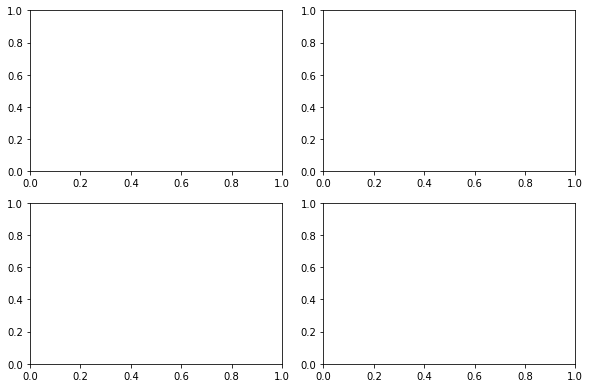

In [ ]:
# fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
# axes=axes.flatten()

# for i,ax in enumerate(axes):
#     j=models[i]
#     time=input_data.loc[j:j+steps_til_end,"Time"].values
#     real_temp=input_data.loc[j:j+steps_til_end,"gas_temp"].values
#     ax.plot(time,real_temp,label="UCLCHEM",color="black")
#     ax.plot(time,pred_temp[:,i],label="Uclchemulator")
#     ax.set(xscale="log")
#     ax.legend()
#     ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
#     ax.set(title=labels[i])
# fig.savefig("dataset_time_testing.png",dpi=300)

# Prediction Accuracy

We want to see how prediction accuracy varies with time. Get the input values at t=0 year and then predict their values at t=1000 yr, t=0.1 yr and t=1Myr

Then we can do the plots we did to compare predicted and real values for single time steps in the prototyping notebook but after that many time steps.

It's more quantitative than "here's some models".


In [ ]:
test_steps=[1,100,1000]

data=data[data["Time"]==0.0].reset_index(drop=True)

output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)

idx=(output_data["Time"]==1e6)
full_runs=output_data.loc[idx,"outputFile"].unique()

data=data[data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isi3n(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)

output_data["dust_temp"]=output_data["dust_temp"].astype(float)

FileNotFoundError: File ../data/Small-Network-Emulator-Output.hdf does not exist

In [ ]:
scaled_output_data={}
reals={}
for nsteps in test_steps:
    idx=output_data["Time"]==1000.0*nsteps

    scaled_output_data[nsteps]=emulator.prepare_outputs(
        output_data.sort_values("outputFile").loc[idx],
        learn_scaling=False)
    real= output_data.loc[idx,["gas_temp","dust_temp"]+list(emulator.autoencoder.species)]
    real=np.where(real<1e-20,1e-20,real)
    real=np.log10(real).round(1)
    reals[nsteps]=real

input_data=emulator.prepare_inputs(input_data,learn_scaling=False)

In [ ]:
mses={}
predicts={}
for nsteps in test_steps:
    print(f"starting {nsteps} steps")
    start=perf_counter()

    predict=emulator.predict_multiple_timesteps(input_data.copy(),nsteps)


    mse=(predict.values[:,0]-scaled_output_data[nsteps].values[:,0])**2.0
    mses[nsteps]=mse.mean()
    predicts[nsteps]=predict.copy()
    end=perf_counter()
    end=(end-start)/60.0
    print(f"{nsteps} steps in {end} minutes")

starting 1 steps
1 steps in 0.02074520559999655 minutes
starting 100 steps
100 steps in 2.024059337166667 minutes
starting 1000 steps
1000 steps in 23.474134560650054 minutes


In [ ]:
def get_plot_df(real,pred):
    df=pd.DataFrame({"Real":real,"Predicted":pred})
    df=df.groupby("Real")["Predicted"].agg([lambda x: np.percentile(x,10),
            lambda x: np.percentile(x,50),
            lambda x: np.percentile(x,90)]).reset_index()
    df.columns=["Real","lower","median","upper"]
    return df

In [ ]:
%%time
plot_df=pd.DataFrame()
plot_specs=["H","H+","H2","C","C+","CO","CH3OH","O","CH+","H2O","CO2","E-"]
plots=[0,1]+[i+2 for i in range(len(emulator.autoencoder.species)) if emulator.autoencoder.species[i] in plot_specs]
labels=["$log(T_g / K )$","$log(T_d / K )$"]+[f"log X({emulator.autoencoder.species[i-2]})"  for i in plots[2:] ]

for nsteps in [1000,100,1]:
    predict=emulator.recover_real_values(predicts[nsteps])
    predict=np.log10(predict).round(1)
    for i,idx in enumerate(plots):
        df=get_plot_df(reals[nsteps][:,idx],predict.values[:,idx])
        df["Quantity"]=labels[i]
        df["Nsteps"]=nsteps
        plot_df=plot_df.append(df)

CPU times: user 9.94 s, sys: 446 ms, total: 10.4 s
Wall time: 7.82 s


$log(T_g / K )$ 0
$log(T_g / K )$ 0
$log(T_g / K )$ 0


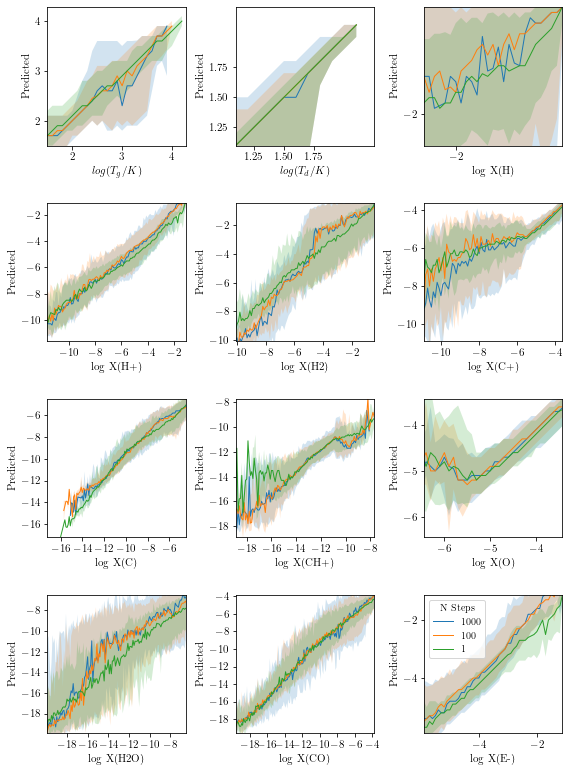

In [ ]:
fig,axes=plt.subplots(4,3,figsize=(8,11),tight_layout=True)
axes=axes.flatten()
colors=sns.color_palette()
for j,nsteps in enumerate(plot_df["Nsteps"].unique()):
    idx=(plot_df["Nsteps"]==nsteps)
    color=colors[j]
    for i,label in enumerate(labels):
        idx2=idx & (plot_df["Quantity"]==label)
        axes[i].fill_between(plot_df.loc[idx2,"Real"],plot_df.loc[idx2,"lower"],plot_df.loc[idx2,"upper"],alpha=0.2)
        axes[i].plot(plot_df.loc[idx2,"Real"],plot_df.loc[idx2,"median"],color=color,label=f"{nsteps}")
        axes[i].set(xlabel=labels[i],ylabel="Predicted",aspect="equal")

        if i==0:
            print(label,i)
            axes[i].set(xticks=[1,2,3,4],yticks=[1,2,3,4])
        elif i==1:
            axes[i].set(xticks=np.arange(1,2,0.25),yticks=np.arange(1,2,0.25))
        elif i==8:
            axes[i].set(xticks=[-8,-7,-6,-5,-4,],yticks=[-8,-7,-6,-5,-4,])
        else:
            axes[i].set(xticks=np.arange(-18,0,2),yticks=np.arange(-18,0,2))
        axes[i].set(xlim=(plot_df.loc[idx2,"median"].min(),1.07*plot_df.loc[idx2,"median"].max()),
           ylim=(plot_df.loc[idx2,"median"].min(),1.07*plot_df.loc[idx2,"median"].max()))
axes[-1].legend(title="N Steps")


In [ ]:
fig.savefig("../../Paper/80_error_over_time.pdf",type="PDF")

<ipython-input-14-b50f73c3c7f0>:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "type" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig("../../Paper/80_error_over_time.pdf",type="PDF")


# Error by Density/Fuv

In [ ]:
input_data

,gas_temp,gas_density,local_radfield,zeta,metallicity,Chem_1,Chem_2,Chem_3,Chem_4,Chem_5,Chem_6,Chem_7,Chem_8
0,0.455944,0.230221,0.000000,0.107411,0.595159,0.996677,0.402851,0.000000,0.109382,0.510081,0.092782,0.007007,0.000000
1,0.457997,0.371536,0.594919,0.365937,0.358836,0.095872,0.042026,0.082784,0.018923,0.446812,0.001684,0.821747,0.004550
2,0.251091,0.431041,0.529872,0.626363,0.071607,0.160930,0.057245,0.088123,0.020241,0.418845,0.002689,0.834862,0.000869
3,0.200375,0.076106,0.559142,0.164716,0.806981,0.018975,0.021669,0.074606,0.016998,0.490161,0.000423,0.800710,0.011007
4,0.480283,0.702570,0.434564,0.503650,0.139414,0.144987,0.053529,0.086858,0.019924,0.425452,0.002446,0.831791,0.001705
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19955,0.249866,0.279828,0.000000,0.402640,0.425442,0.996108,0.402266,0.000000,0.107209,0.526588,0.092679,0.037271,0.000000
19956,0.885801,0.875786,0.000000,0.283928,0.965196,0.004608,0.015746,0.071776,0.016358,0.505314,0.000150,0.793112,0.013481
19957,0.614646,0.406441,0.857475,0.810781,0.241023,0.121682,0.048097,0.084966,0.019456,0.435349,0.002087,0.827161,0.002996
19958,0.767474,0.821880,0.561915,0.651265,0.238123,0.122336,0.048250,0.085020,0.019469,0.435066,0.002097,0.827293,0.002958


In [ ]:
plot_df=input_data[["gas_density","radfield"]].merge(emulator.recover_real_values(predicts[nsteps])["gas_temp"],
                                             left_index=True,right_index=True)
plot_df["real_temp"]=10.0**reals[nsteps][:,0]
plot_df["fractional_error"]=np.sqrt((plot_df["gas_temp"]-plot_df["real_temp"]).pow(2))/plot_df["real_temp"]

KeyError: "['radfield'] not in index"

In [ ]:
def get_mesh(plot_grid,var1,var2,values):
    pivot=plot_grid.groupby([var1,var2])[values].mean().reset_index()
#     for var in [var1,var2]:
#         pivot=pivot[pivot[var]>0.9*positive[var].min()]
#         pivot=pivot[pivot[var]<1.1*positive[var].max()]


    pivot=pivot.pivot(index=var1,columns=var2,values=values)
    c = np.array(pivot.columns)
    x=np.append(c,c[-1]+np.diff(c).mean())
    r = np.array(pivot.index)
    y=np.append(r,r[-1]+np.diff(r).mean())
    X,Y = np.meshgrid(x,y)
    return X,Y,pivot.values

In [ ]:
x,y,z=get_mesh(plot_df.round(1),"gas_density","radfield","fractional_error")

In [ ]:
min_val=emulator.input_scaling_summary.loc["gas_density"]["min"]
max_val=emulator.input_scaling_summary.loc["gas_density"]["max"]
x=10.0**(x*(max_val-min_val)+min_val)

min_val=emulator.input_scaling_summary.loc["radfield"]["min"]
max_val=emulator.input_scaling_summary.loc["radfield"]["max"]
y=10.0**(y*(max_val-min_val)+min_val)


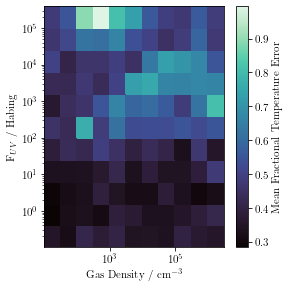

In [ ]:
fig,ax=plt.subplots(figsize=(4.1,4.1),tight_layout=True)
pc = ax.pcolormesh(x,y,z,edgecolor="face",cmap=sns.color_palette("mako",as_cmap=True))
ax.set(xlabel="Gas Density / cm$^{-3}$",ylabel="F$_{UV}$ / Habing",xscale="log",yscale="log")
fig.colorbar(pc,label="Mean Fractional Temperature Error")

In [ ]:
fig.savefig("../../Paper/temperature_error_dist.pdf",type="PDF")

In [ ]:
sns.heatmap(data=plot_df.pivot(index="gas_density",columns="radfield",values="fractional_error"))

RuntimeError: latex was not able to process the following string:
b'gas_density'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/jon/.cache/matplotlib/tex.cache/f70bb47e060f80f818b5530cd542c01d.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty))

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file f70bb47e060f80f818b5530cd542c01d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...tsize{11.000000}{13.750000}{\rmfamily gas_
                                                  density}
No pages of output.
Transcript written on f70bb47e060f80f818b5530cd542c01d.log.




<Figure size 432x288 with 2 Axes>

# Rollig Benchmarks

The real time dependent test people will want to see is to run the Rollig Benchmarks that we compared UCLCHEM to UCLPDR using.

In [ ]:
def prep_rollig(model):
    model_df=pd.read_csv(join(rollig_folder,model))
    model_df["zeta"]=3.84
    if model=="high_cr.csv":
        model_df["zeta"]=123
    #model_df["metallicity"]=1.0
    model_df["local_radfield"] = 1.7*model_df["FUV"] * np.exp(-3.02 * model_df["total_col_dens"] * 1.6e-21)
    model_df["local_radfield"]=np.where(model_df["local_radfield"]<1e-5,1e-5,model_df["local_radfield"])

    model_df=model_df[['T_g', 'n_H',"local_radfield","zeta"]]
    model_df.columns=['gas_temp','gas_density','local_radfield','zeta']


    for spec in emulator.autoencoder.species:
        model_df[spec]=0.0

    initial_abunds={
        "H":0.4,
        "H2":0.3,
        "HE":0.1,
        "C+":1.0e-4,
        "O":3.0e-4,
        "MG":5.00e-06,
        "E-":1.0e-4
    }

    for spec,abund in initial_abunds.items():
        model_df[spec]=abund
    model_df=emulator.prepare_inputs(model_df,learn_scaling=False)
    model_df[model_df<0]=0.0
    return model_df

In [ ]:
%%time
models=["low_rad.csv","high_cr.csv","10_1e3.csv","10_1e5.5.csv","1e5_1e3.csv","1e5_1e5.5.csv"]
labels=[r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}$',
        r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}, \zeta$ 100',
        r'$F_{UV} 10 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10 n_H 10^{5.5} cm^{-3}$',
        r'$F_{UV 10^5 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10^5 n_H 10^{5.5} cm^{-3}$']


plot_df=pd.DataFrame()
for m,model in enumerate(models):
    model_df=prep_rollig(model)

    output=emulator.predict_multiple_timesteps(model_df,2000)
    output=emulator.recover_real_values(output)

    uclchem=join(rollig_folder,"../uclpdr/",model).replace(".csv","_output.csv")
    uclchem=pd.read_csv(uclchem)
    idx=uclchem["Particle"].isin((pd.read_csv(join(rollig_folder,model)))["Particle"])
    uclchem=uclchem.loc[idx].reset_index(drop=True)
    av=uclchem["Av"]
    output["Av"]=av
    output.to_csv(f"../../Benchmarking/emulator/{model}.csv",index=False)
    real_temp=uclchem["T_g"]
    pred_temp=output["gas_temp"]
    uv=model.split('_')[0].replace("1e","10^")
    label=f"F_{{uv}} {uv}, n_H {model.split('_')[1][:-4]}"

    model_df=pd.DataFrame({"Av":av,"Real Temp":real_temp,"Predicted":pred_temp})
    model_df["Model"]=label

    plot_df=plot_df.append(model_df,sort=False)


CPU times: user 2min 51s, sys: 5.61 s, total: 2min 56s
Wall time: 2min 24s


In [ ]:
labels=[r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}$',
        r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}, \zeta$ 100',
        r'$F_{UV} 10 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10 n_H 10^{5.5} cm^{-3}$',
        r'$F_{UV} 10^5 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10^5 n_H 10^{5.5} cm^{-3}$']

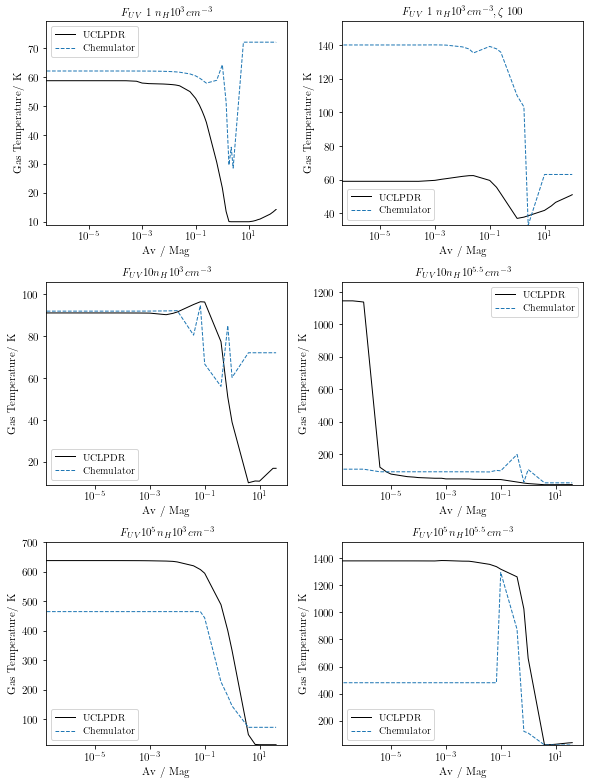

In [ ]:
fig,axes=plt.subplots(3,2,figsize=(8.3,11),tight_layout=True)
axes=axes.flatten()

for i,model in enumerate(plot_df.Model.unique()):
    idx=plot_df["Model"]==model

    label=f"F_{{uv}} {uv}, n_H {model.split('_')[1][:-4]}"


    axes[i].plot(plot_df.loc[idx,"Av"],plot_df.loc[idx,"Real Temp"],label="UCLPDR",color="black")
    axes[i].plot(plot_df.loc[idx,"Av"],plot_df.loc[idx,"Predicted"],label="Chemulator",ls="--")
    axes[i].set(xscale="log")
    axes[i].legend()
    axes[i].set(ylabel="Gas Temperature/ K",xlabel="Av / Mag")
    tmax=plot_df.loc[idx,["Real Temp","Predicted"]].max().max()
    axes[i].set(ylim=(0.9*plot_df.loc[idx,"Real Temp"].min(),1.1*tmax))
    axes[i].legend()

    axes[i].set(title=labels[i])

In [ ]:
emulated.head()

,gas_temp,dust_temp,H,H+,H2,H2+,H3+,HE,HE+,C+,...,H3O+,MG,MG+,CO+,CO,HCO+,O2,O2+,E-,Av
0,50.242823,14.738799,1.0,0.000013,0.000430,6.765373e-14,3.190240e-15,0.107057,5.586305e-07,0.000075,...,7.315540e-17,8.415378e-08,0.000010,4.034282e-14,6.802436e-08,3.937465e-15,3.287298e-12,1.277238e-14,0.000099,0.000000e+00
1,50.393051,14.744650,1.0,0.000014,0.000414,7.131218e-14,3.075414e-15,0.106778,6.227359e-07,0.000077,...,6.141316e-17,8.869728e-08,0.000011,4.054603e-14,5.960385e-08,3.701441e-15,3.292976e-12,1.211498e-14,0.000103,6.240000e-07
2,50.453440,14.744785,1.0,0.000014,0.000412,7.077770e-14,3.029859e-15,0.106769,6.223695e-07,0.000077,...,6.051011e-17,8.847902e-08,0.000011,4.034212e-14,5.917167e-08,3.663999e-15,3.265914e-12,1.207914e-14,0.000103,9.920000e-07
3,50.502261,14.744463,1.0,0.000014,0.000410,7.041912e-14,2.999045e-15,0.106765,6.221741e-07,0.000077,...,5.993407e-17,8.832256e-08,0.000011,4.019771e-14,5.888262e-08,3.637671e-15,3.247021e-12,1.206141e-14,0.000103,1.376000e-06
4,50.531708,14.744329,1.0,0.000014,0.000409,7.020358e-14,2.977699e-15,0.106758,6.223463e-07,0.000077,...,5.941071e-17,8.821556e-08,0.000011,4.008726e-14,5.872289e-08,3.618391e-15,3.231834e-12,1.203342e-14,0.000103,1.760000e-06


In [ ]:
fig.savefig("../../Paper/emulator-rollig.pdf",dpi=300)

In [ ]:
../../Benchmarking/uclpdr/low_rad.csv_output.csv'

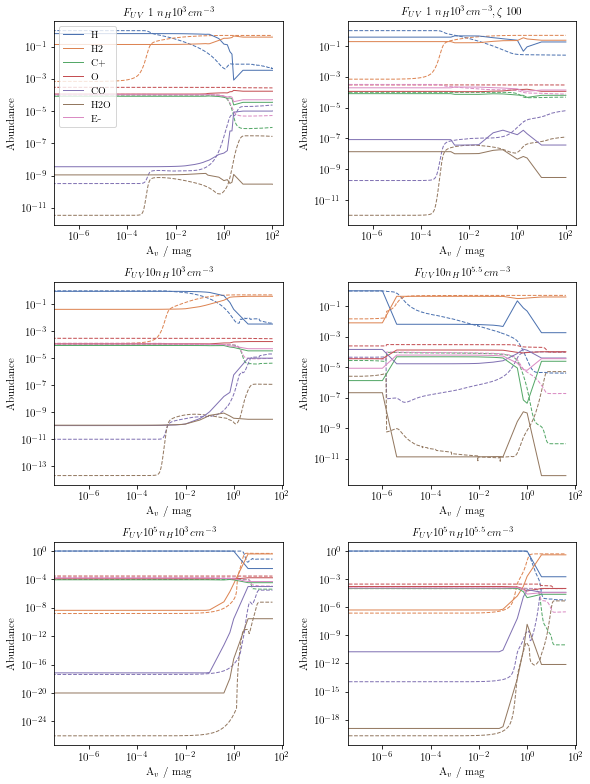

In [ ]:
["H","H2","C+","O","CO","H2O","E-"]
fig,axes=plt.subplots(3,2,figsize=(8.3,11),tight_layout=True)
axes=axes.flatten()
colors=sns.color_palette("deep",n_colors=7)

models=["low_rad.csv","high_cr.csv","10_1e3.csv","10_1e5.5.csv","1e5_1e3.csv","1e5_1e5.5.csv"]
labels=[r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}$',
        r'$F_{UV}$ 1 $n_H 10^3 cm^{-3}, \zeta$ 100',
        r'$F_{UV} 10 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10 n_H 10^{5.5} cm^{-3}$',
        r'$F_{UV} 10^5 n_H 10^3 cm^{-3}$',
        r'$F_{UV} 10^5 n_H 10^{5.5} cm^{-3}$']

for k,model in enumerate(models):
    axis=axes[k]

    uclpdr=pd.read_csv(f"../../Benchmarking/uclpdr/{model}".replace(".csv","_output.csv"))
    emulated=pd.read_csv(f"../../Benchmarking/emulator/{model}.csv")

    uclpdr_species=["H_abun","H2_abun","C+_abun","O_abun","CO_abun","H2O_abun","e-_abun"]

    for i,col in enumerate(uclpdr_species):
        axis.plot(uclpdr["Av"],uclpdr[col],color=colors[i],ls="--",label="")

    uclchem_species=["H","H2","C+","O","CO","H2O","E-"]
    for i,col in enumerate(uclchem_species):
        axis.plot(emulated["Av"],emulated[col],color=colors[i],label=col)

    axis.set(xscale='log',yscale='log',xlabel="A$_v$ / mag",ylabel="Abundance")
    axis.legend(loc=2)
    if k!=0:
        axis.legend().remove()
    axes[k].set(title=labels[k])

In [ ]:
fig.savefig("../../Paper/emulator-rollig-chemistry.pdf",dpi=300)

In [ ]:
model="sine.csv"
model_df=prep_rollig(model)

output=emulator.predict_multiple_timesteps(model_df,2000)
output=emulator.recover_real_values(output)

../src/chemulator.py:124: RuntimeWarning: divide by zero encountered in log10
  inputs=np.log10(input_data[self.physics_labels].reset_index(drop=True))


In [ ]:
uclpdr=join(rollig_folder,"../uclpdr/",model).replace(".csv","_output.csv")
uclpdr=pd.read_csv(uclpdr)
idx=uclpdr["Particle"].isin((pd.read_csv(join(rollig_folder,model)))["Particle"])
uclpdr=uclpdr.loc[idx].reset_index(drop=True)

[None, Text(0, 0.5, 'Abundance'), None, Text(0.5, 0, '$A_v$ / Mag')]

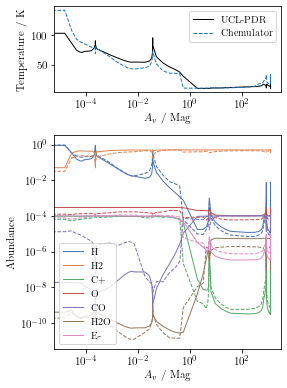

In [ ]:
fig = plt.figure(tight_layout=True,figsize=(4.1,5.5))

gs = gridspec.GridSpec(3, 1)

ax = fig.add_subplot(gs[0, 0])

ax.plot(uclpdr["Av"],uclpdr["T_g"],color="black",label="UCL-PDR")
ax.plot(uclpdr["Av"],output["gas_temp"],ls="--",label="Chemulator")
ax.set(xscale="log",xlabel="$A_v$ / Mag", ylabel="Temperature / K")
ax.legend()
ax2 = fig.add_subplot(gs[1:,0])

colors=sns.color_palette("deep",n_colors=7)
for i,species in enumerate(["H","H2","C+","O","CO","H2O","E-"]):
    if species=="E-":
        ax2.plot(uclpdr["Av"],uclpdr[f"e-_abun"],color=colors[i],label=species)
    else:
        ax2.plot(uclpdr["Av"],uclpdr[f"{species}_abun"],color=colors[i],label=species)
    ax2.plot(uclpdr["Av"],output[f"{species}"],ls="--",color=colors[i])
ax2.legend()
ax2.set(xscale="log",yscale="log",xlabel="$A_v$ / Mag", ylabel="Abundance")

In [ ]:
fig.savefig("../../Paper/emulator-sine.pdf",type="PDF")